# Task 2 Clustering
*Alberto Roberto Marinelli, Giacomo Cignoni, Alessandro Bucci*
## Importing Libraries
First we import the libraries necessary to cluster the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import pi
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from prettytable import PrettyTable
from tqdm import tqdm
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy.stats import mode
from scipy.cluster.hierarchy import linkage, dendrogram, fclusterdata

Import DataFrame of generated user indicators (with excluded features due to high correlation)

In this clustering trial **we do not use entropy features**

In [8]:
df = pd.read_csv("../dataset/user_indicators_uncorrelated.csv") 
df.head(10)

,user_id,lang,bot,created_at,statuses_count,tweet_count,avg_text_len,entropy_minute,entropy_day,post_in_2012,...,years_outside_of_plausible_range,creation_year,reply_count_avg,favorite_count_avg,num_hashtags_avg,num_urls_avg,num_mentions_avg,retweet_count_sum,favorite_count_sum,total_success_score
0,2353593986,en,1,2019-02-22 18:00:42,76,127,62.378788,2.535773,1.227162,0,...,0,2019,0.000000,0.037879,0.098485,0.000000,0.272727,5,5,0.203666
1,2358850842,en,0,2019-02-26 03:02:32,54,119,68.762295,2.302317,1.281955,0,...,0,2019,0.000000,0.049180,0.024590,0.000000,0.336066,3,6,0.204082
2,137959629,en,1,2015-04-30 07:09:56,3,4,19.250000,4.000000,1.265081,0,...,0,2015,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0.000000
3,466124818,it,1,2017-01-18 02:49:18,50,1394,86.763030,7.495216,0.347218,0,...,0,2017,0.000000,0.166782,0.073662,0.022238,0.006254,1190,240,9.721278
4,2571493866,en,0,2019-06-18 19:30:21,7085,3535,72.214442,5.999865,0.000000,0,...,0,2019,0.000000,0.056072,0.117888,0.000821,0.505470,62,205,0.116998
5,2199062688,en,0,2018-11-19 06:58:18,7406,1989,45.100913,5.677881,0.265405,0,...,0,2018,0.000000,0.735704,0.024027,0.022585,0.928400,819284,1531,404.521709
6,1174869769,en,1,2018-02-15 10:51:28,21,24,64.041667,4.175736,2.750914,0,...,0,2018,0.000000,94.666667,0.458333,0.125000,0.125000,15124,2272,1017.309942
7,3118659848,en,0,2020-03-31 21:19:59,115,130,62.400000,5.602282,0.719549,0,...,0,2020,0.000000,0.925926,0.111111,0.088889,0.807407,417191,125,3066.245408
8,616225564,en,0,2017-06-25 15:49:36,2041,58,66.883333,5.153498,3.087111,0,...,0,2017,0.016667,0.050000,0.233333,0.033333,0.016667,4191,3,245.321637
9,2357425536,en,1,2019-02-25 04:30:56,69,144,64.286667,2.239529,1.180164,0,...,0,2019,0.000000,0.033333,0.100000,0.000000,0.340000,6,5,0.166415


In [9]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11508 entries, 0 to 11507
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   user_id                           11508 non-null  int64  
 1   lang                              11508 non-null  object 
 2   bot                               11508 non-null  int64  
 3   created_at                        11508 non-null  object 
 4   statuses_count                    11508 non-null  int64  
 5   tweet_count                       11508 non-null  int64  
 6   avg_text_len                      11508 non-null  float64
 7   entropy_minute                    11508 non-null  float64
 8   entropy_day                       11508 non-null  float64
 9   post_in_2012                      11508 non-null  int64  
 10  post_in_2013                      11508 non-null  int64  
 11  post_in_2014                      11508 non-null  int64  
 12  post

Save bot column for final analysis

In [10]:
df_bot = df.bot.copy()

Define colors for bot attribute for plot consistency

In [11]:
dict_colors_bot = { 1: 'teal', 0: 'sandybrown'}

Convert to logscale some columns with few exceptionally high values

In [12]:
df.statuses_count = np.log(df.statuses_count + 1)

Exclude some user specific features that are not useful or no to be used in clustering

In [13]:
cat_feature = df[['user_id', 'lang', 'created_at']]
df.drop(['post_in_2012','post_in_2013','post_in_2014','post_in_2015','post_in_2016','post_in_2017','post_in_2018','post_in_2019','post_in_2020'], axis=1, inplace=True)
df.drop(['years_outside_of_plausible_range', 'creation_year', 'reply_count_avg', 'favorite_count_avg', 'num_hashtags_avg', 'num_urls_avg', 'num_mentions_avg'], axis=1, inplace=True)
df.drop(['retweet_count_sum', 'favorite_count_sum', 'user_id', 'lang', 'created_at', 'bot'], axis=1, inplace=True)
df.head()

,statuses_count,tweet_count,avg_text_len,entropy_minute,entropy_day,total_success_score
0,4.343805,127,62.378788,2.535773,1.227162,0.203666
1,4.007333,119,68.762295,2.302317,1.281955,0.204082
2,1.386294,4,19.250000,4.000000,1.265081,0.000000
3,3.931826,1394,86.763030,7.495216,0.347218,9.721278
4,8.865876,3535,72.214442,5.999865,0.000000,0.116998


## Clustering Preprocessing - Normalization  
A good practice in clustering to avoid the bias given by the range of the different attribute is normalization.  
The most common adopted normalizations are: Z-Score and Min-Max.

We tried both normalizations to be used in subsequent clusterings.

In [14]:
scaler = StandardScaler()
X_std = scaler.fit_transform(df.values)

In [15]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(df.values)

# DBSCAN

Function that shows graph of k-th nearest neighbour diastance in in order to use Knee Method to estimate the best eps. Multiple values of k are used.

In [83]:
def calc_k_nn_dist_graph(X, ub=0., lb=0.):
    # List of k (for k-th nearest neighbour)
    k_list = [3, 6, 9, 12]

    dist = pdist(X, 'euclidean') #pair wise distance
    dist = squareform(dist) #distance matrix given the vector dist
    
    # Calculate sorted list of distances for points for each k
    for k in k_list:
        kth_distances = list()
        for d in dist:
            index_kth_distance = np.argsort(d)[k]
            kth_distances.append(d[index_kth_distance])

        # Plot the graph of distance from k-th nearest neighbour
        plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
        plt.ylabel('dist from %sth neighbor' % k, fontsize=18)
        plt.xlabel('sorted distances', fontsize=18)
        plt.tick_params(axis='both', which='major', labelsize=22)
        plt.grid()
        plt.axhline(ub)
        plt.axhline(lb)

        f = plt.figure()
        f.set_figwidth(4)
        f.set_figheight(1)


        plt.show()

Function that returns a nested list of fitted DBSCANs, one for each combination of eps and minpts values that are passed as lists.

In [72]:
def db_scan_function (X, eps_list, minpts_list, max_iter_value=300):
    # Table with dim = len(eps_list) x len(minpts)
    dbscan_table = list()

    # Iterate over eps (rows)
    for i, eps in tqdm(enumerate(eps_list)):
        dbscan_table.append([]) 
        # Iterate over minpts
        for minpts in tqdm(minpts_list, leave=False):
            dbscan = DBSCAN(eps=eps, min_samples=minpts, n_jobs=-1)
            dbscan.fit(X)
            dbscan_table[i].append(dbscan)
    
    return dbscan_table

#### DBSCAN with **minmax normalization**

k-th nn graphs

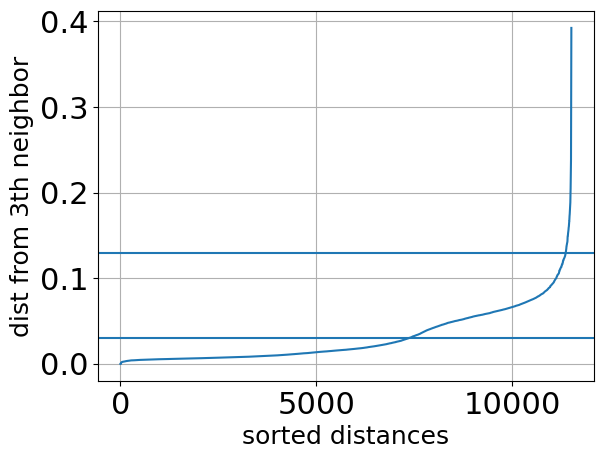

<Figure size 400x100 with 0 Axes>

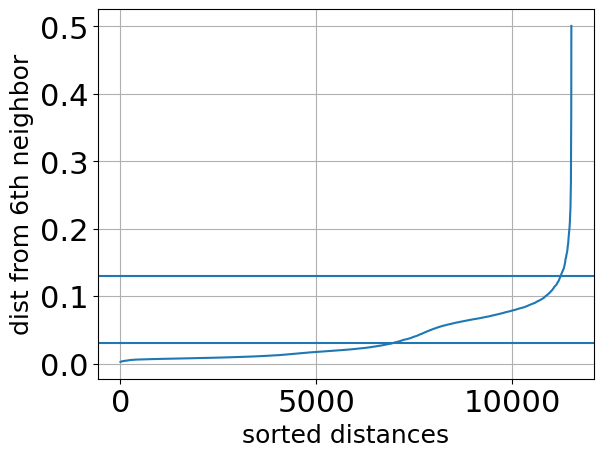

<Figure size 400x100 with 0 Axes>

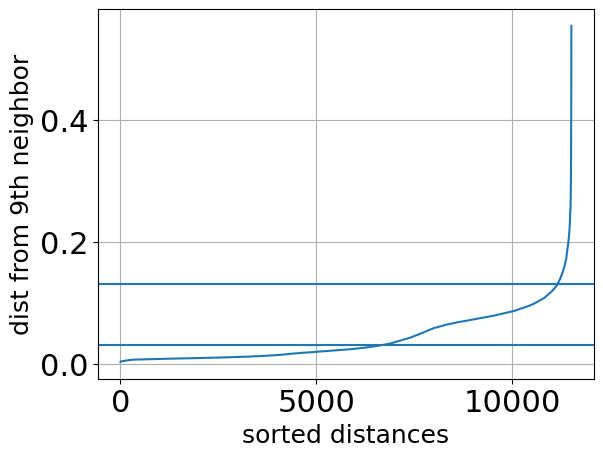

<Figure size 400x100 with 0 Axes>

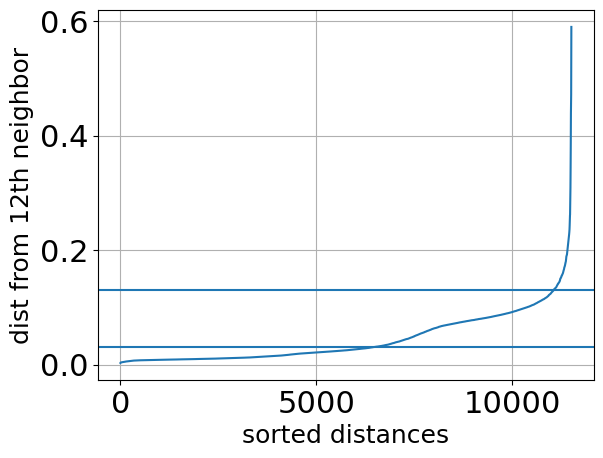

<Figure size 400x100 with 0 Axes>

In [77]:
calc_k_nn_dist_graph(X_minmax, 0.03, 0.13)

We select values for eps around 0.03-0.13 according to the knee method

Fit DBSCANs with MINMAX normalization

In [78]:
eps_list = [0.03, 0.05, 0.07, 0.09, 0.11, 0.13] # min max vals
minpts_list = [5, 10, 15] # min-max vals

# Table with fitted dbscans (rows are eps values, cols are minpts values)
dbscan_table = db_scan_function(X_minmax, eps_list, minpts_list)

6it [00:05,  1.14it/s]


Calculate and print Silhouette for each DBSCAN

In [79]:
t = PrettyTable()
t.field_names = ['eps\minpts'] + minpts_list

for i, eps in tqdm(enumerate(eps_list)):
    row_str = [str(eps)]
    for j, minpts  in tqdm(enumerate(minpts_list), leave=False):
        dbscan = dbscan_table[i][j]

        try: # Exception in case of num_clusters=1
            silhouette = round(silhouette_score(X_minmax, dbscan.labels_), 2)
        except:
            silhouette = np.nan
        cell_str = str(silhouette) + '-n_clust:'+str(len(np.unique(dbscan.labels_))-1)
        row_str.append(cell_str)

    t.add_row(row_str)

print('MINMAX normalization \n')
print(t)

6it [00:33,  5.67s/it]

MINMAX normalization 

+------------+------------------+-----------------+-----------------+
| eps\minpts |        5         |        10       |        15       |
+------------+------------------+-----------------+-----------------+
|    0.03    | 0.17-n_clust:41  | 0.25-n_clust:11 |  0.2-n_clust:12 |
|    0.05    | 0.18-n_clust:62  | 0.28-n_clust:19 | 0.28-n_clust:13 |
|    0.07    | -0.11-n_clust:25 | 0.35-n_clust:21 | 0.34-n_clust:17 |
|    0.09    | -0.28-n_clust:10 | -0.25-n_clust:6 | -0.26-n_clust:6 |
|    0.11    | -0.21-n_clust:6  | -0.21-n_clust:3 | -0.24-n_clust:4 |
|    0.13    | -0.07-n_clust:4  |  0.01-n_clust:2 | -0.03-n_clust:2 |
+------------+------------------+-----------------+-----------------+


Print number elem for each cluster for each DBSCAN

In [80]:
print('MINMAX normalization - count of elements for each cluster\n')

for i, eps in enumerate(eps_list):
    for j, minpts  in enumerate(minpts_list):
        dbscan = dbscan_table[i][j]
        n_clusters = len(np.unique(dbscan.labels_))-1 # -1 to exclude outlier label
        occ_list = []
        for k in range(-1, n_clusters):
             occ_list.append(np.count_nonzero(dbscan.labels_ == k))
        print('eps:', eps, ', minpts:', minpts, '-', occ_list)

MINMAX normalization - count of elements for each cluster

eps: 0.03 , minpts: 5 - [4043, 3155, 277, 825, 2141, 38, 394, 107, 200, 11, 58, 19, 5, 8, 7, 22, 10, 10, 14, 26, 4, 5, 23, 10, 6, 5, 7, 7, 6, 5, 3, 2, 11, 3, 5, 6, 5, 5, 5, 5, 5, 5]
eps: 0.03 , minpts: 10 - [4398, 3155, 270, 822, 2055, 37, 392, 75, 200, 57, 24, 23]
eps: 0.03 , minpts: 15 - [4594, 3155, 249, 822, 934, 974, 37, 392, 59, 200, 51, 22, 19]
eps: 0.05 , minpts: 5 - [2746, 3157, 391, 828, 200, 2306, 55, 20, 48, 924, 201, 8, 55, 28, 66, 5, 70, 8, 20, 12, 11, 7, 15, 8, 26, 5, 12, 6, 7, 6, 6, 23, 9, 25, 7, 6, 12, 7, 8, 10, 5, 5, 12, 7, 12, 4, 7, 3, 9, 10, 4, 5, 6, 6, 5, 5, 6, 5, 8, 5, 4, 6, 5]
eps: 0.05 , minpts: 10 - [3436, 3157, 389, 827, 2285, 42, 850, 201, 16, 66, 58, 12, 26, 19, 23, 51, 13, 8, 18, 11]
eps: 0.05 , minpts: 15 - [3677, 3157, 389, 827, 2275, 41, 744, 201, 66, 48, 26, 23, 26, 8]
eps: 0.07 , minpts: 5 - [926, 3184, 5993, 944, 137, 22, 201, 5, 12, 7, 7, 3, 4, 5, 3, 5, 6, 7, 2, 5, 4, 4, 7, 5, 5, 5]
eps: 0.07

#### DBSCAN with **standard scaler**

k-th nn graphs

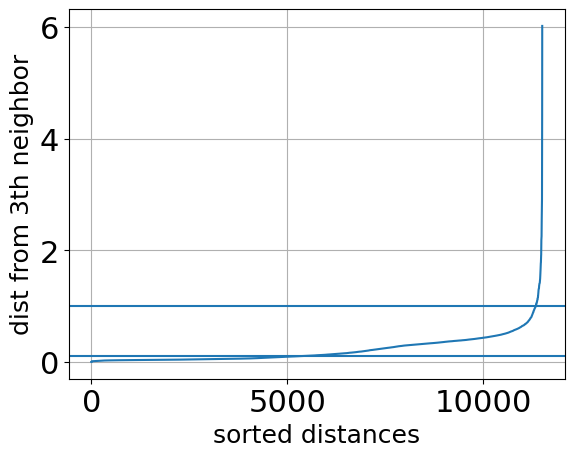

<Figure size 400x100 with 0 Axes>

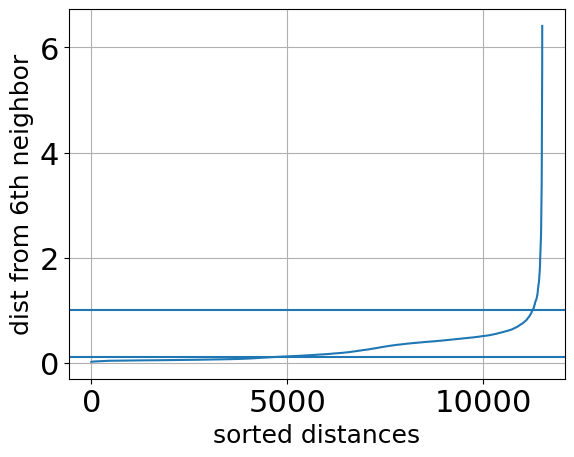

<Figure size 400x100 with 0 Axes>

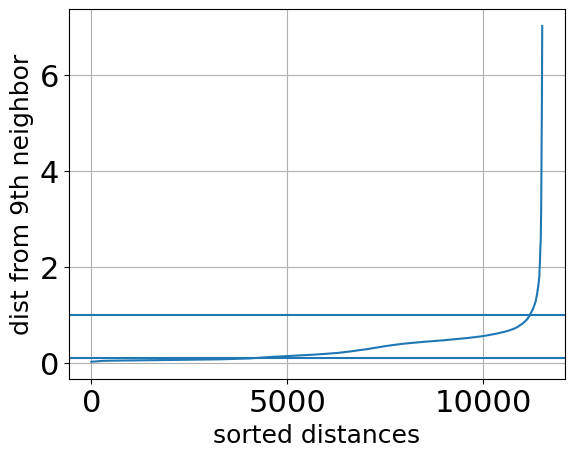

<Figure size 400x100 with 0 Axes>

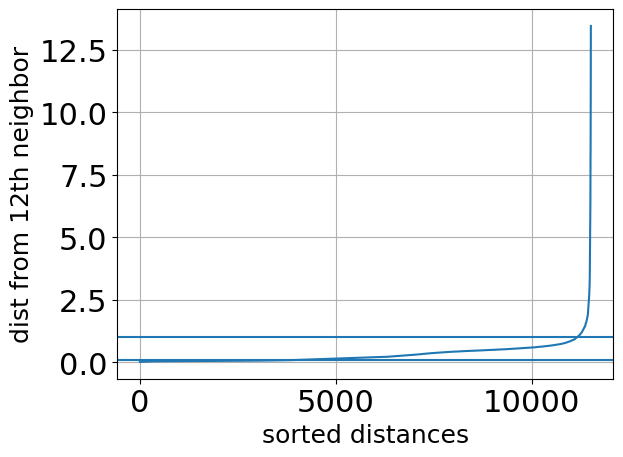

<Figure size 400x100 with 0 Axes>

In [84]:
calc_k_nn_dist_graph(X_std, 1., 0.1)

Fit DBSCANs with STD/MEAN normalization

In [85]:
eps_list = [0.1, 0.3, 0.5, 0.7, 0.9, 1] 
minpts_list = [5, 10, 15] 

# Table with fitted dbscans (rows are eps values, cols are minpts values)
dbscan_table = db_scan_function(X_std, eps_list, minpts_list)

6it [00:05,  1.15it/s]


Calculate and print Silhouette for each DBSCAN

In [86]:
t = PrettyTable()
t.field_names = ['eps\minpts'] + minpts_list


for i, eps in enumerate(eps_list):
    row_str = [str(eps)]
    for j, minpts  in enumerate(minpts_list):
        dbscan = dbscan_table[i][j]

        try: # Exception in case of num_clusters=1
            silhouette = round(silhouette_score(X_std, dbscan.labels_), 2)
        except:
            silhouette = np.nan
        cell_str = str(silhouette) + '-n_clust:'+str(len(np.unique(dbscan.labels_))-1)
        row_str.append(cell_str)
    t.add_row(row_str)

print('STD normalization\n')
print(t)

STD normalization

+------------+------------------+------------------+-----------------+
| eps\minpts |        5         |        10        |        15       |
+------------+------------------+------------------+-----------------+
|    0.1     | -0.03-n_clust:70 | -0.05-n_clust:15 |  0.06-n_clust:8 |
|    0.3     | 0.09-n_clust:59  |  0.2-n_clust:16  | 0.23-n_clust:15 |
|    0.5     |  -0.2-n_clust:7  | -0.22-n_clust:8  |  0.06-n_clust:9 |
|    0.7     | -0.03-n_clust:6  |  0.44-n_clust:1  |  0.02-n_clust:2 |
|    0.9     |  0.34-n_clust:3  |  0.54-n_clust:1  |  0.53-n_clust:1 |
|     1      |  0.5-n_clust:2   |  0.41-n_clust:2  |  0.57-n_clust:1 |
+------------+------------------+------------------+-----------------+


Print number elem for each cluster for each DBSCAN

In [87]:
print('STD normalization - count of elements for each cluster\n')

for i, eps in enumerate(eps_list):
    for j, minpts  in enumerate(minpts_list):
        dbscan = dbscan_table[i][j]
        n_clusters = len(np.unique(dbscan.labels_))-1 # -1 to exclude outlier label
        occ_list = []
        for k in range(-1, n_clusters):
             occ_list.append(np.count_nonzero(dbscan.labels_ == k))
        print('eps:', eps, ', minpts:', minpts, '-', occ_list)

STD normalization - count of elements for each cluster

eps: 0.1 , minpts: 5 - [6139, 3119, 530, 46, 37, 8, 170, 385, 12, 178, 60, 276, 4, 10, 5, 33, 6, 11, 15, 9, 6, 33, 28, 43, 9, 17, 26, 9, 12, 15, 9, 6, 5, 4, 5, 5, 8, 7, 12, 11, 7, 5, 8, 6, 6, 7, 6, 5, 7, 5, 7, 3, 9, 7, 8, 5, 9, 5, 5, 9, 5, 5, 5, 4, 5, 7, 6, 4, 5, 5, 5]
eps: 0.1 , minpts: 10 - [6915, 3100, 529, 382, 155, 276, 15, 33, 17, 10, 15, 10, 10, 11, 19, 11]
eps: 0.1 , minpts: 15 - [7076, 3072, 527, 382, 55, 276, 31, 71, 18]
eps: 0.3 , minpts: 5 - [3215, 3153, 377, 873, 5, 2245, 792, 201, 10, 66, 76, 26, 8, 8, 33, 17, 12, 12, 12, 5, 13, 8, 26, 9, 7, 8, 10, 23, 43, 5, 10, 9, 8, 10, 11, 6, 7, 13, 7, 8, 4, 5, 18, 10, 4, 6, 5, 4, 5, 9, 6, 6, 5, 4, 5, 3, 6, 5, 6, 5]
eps: 0.3 , minpts: 10 - [3886, 3151, 361, 872, 2188, 419, 201, 66, 206, 17, 26, 23, 24, 28, 16, 14, 10]
eps: 0.3 , minpts: 15 - [4176, 3151, 303, 872, 2132, 406, 201, 64, 18, 34, 55, 24, 23, 9, 21, 19]
eps: 0.5 , minpts: 5 - [770, 9445, 942, 133, 202, 2, 9, 5]
eps: 0.

MinMax best DBSCAN clustering:
eps: 0.03 , minpts: 10 - [4398, 3155, 270, 822, 2055, 37, 392, 75, 200, 57, 24, 23]

Std scaler best DBSCAN clustering:
eps: 0.3 , minpts: 15 - [4176, 3151, 303, 872, 2132, 406, 201, 64, 18, 34, 55, 24, 23, 9, 21, 19]


### Further analysis of final DBSCAN

#### dbscan_final_minmax

In [89]:
dbscan_final_minmax = DBSCAN(eps=0.03, min_samples=10, n_jobs=-1)
dbscan_final_minmax.fit(X_minmax)

DBSCAN(eps=0.03, min_samples=10, n_jobs=-1)

In [112]:
n_clusters = len(np.unique(dbscan_final_minmax.labels_))

In [113]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(dbscan_final_minmax.labels_,index=df.index)

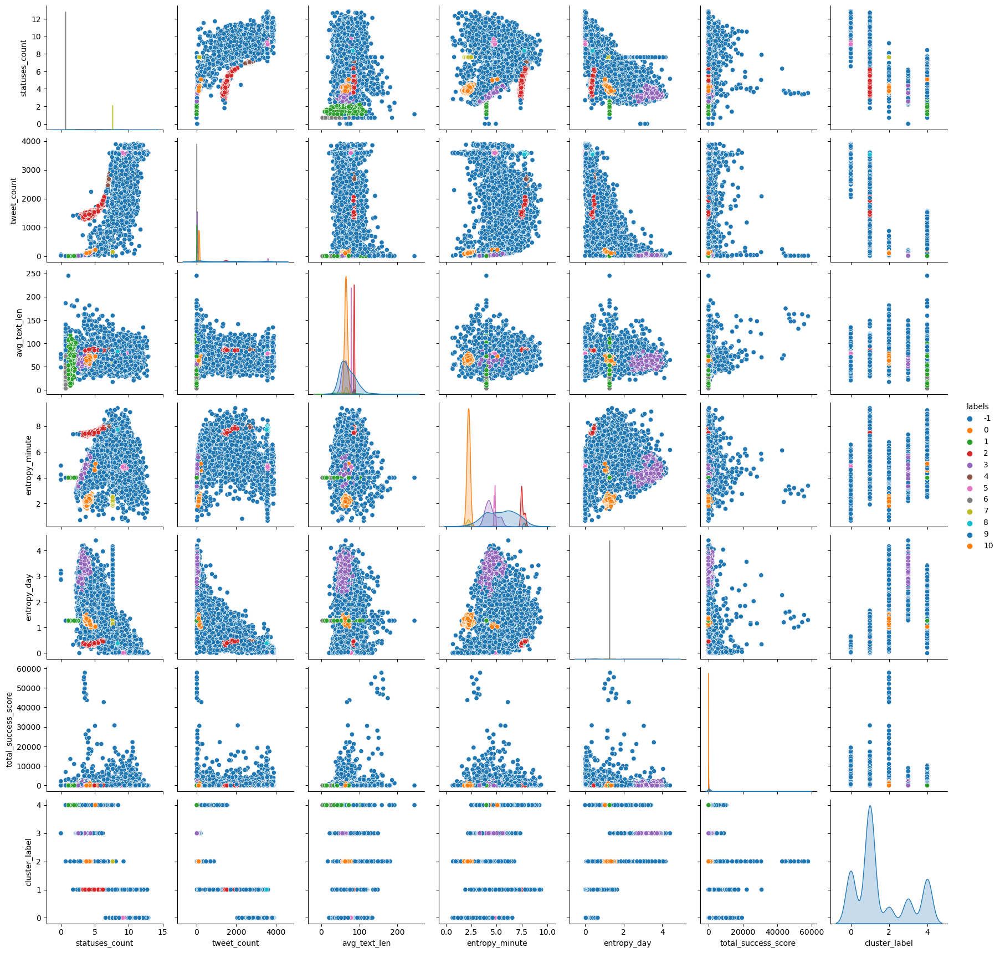

In [114]:
sns.pairplot(df,hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

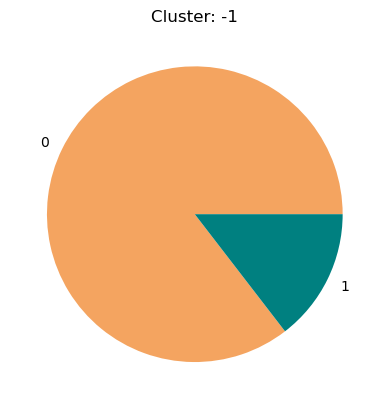

0    3758
1     640
Name: bot, dtype: int64


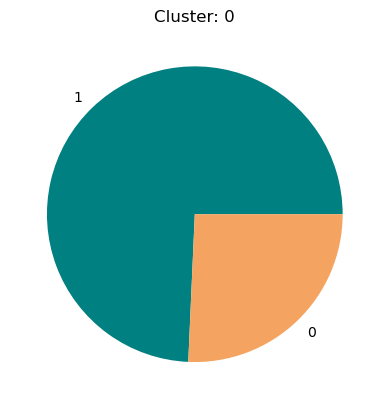

1    2344
0     811
Name: bot, dtype: int64


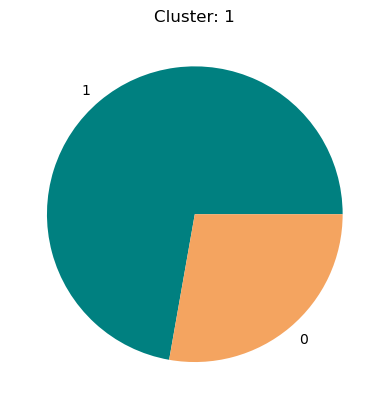

1    195
0     75
Name: bot, dtype: int64


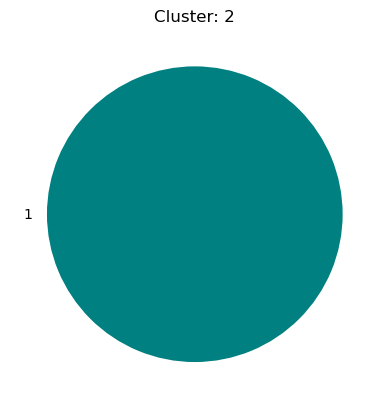

1    822
Name: bot, dtype: int64


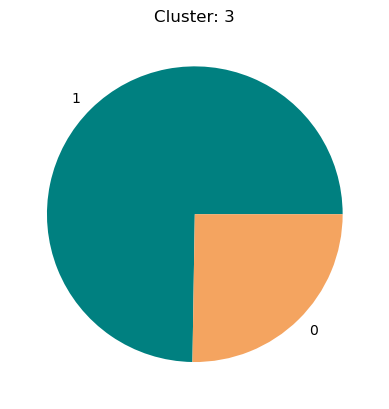

1    1536
0     519
Name: bot, dtype: int64


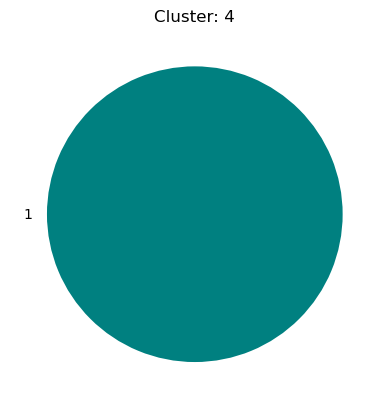

1    37
Name: bot, dtype: int64


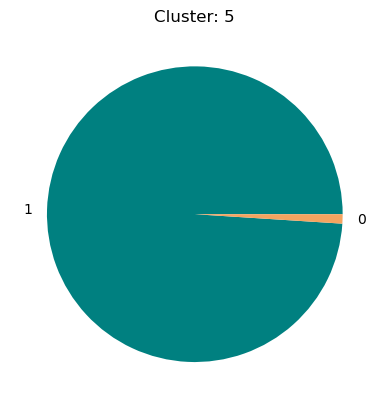

1    388
0      4
Name: bot, dtype: int64


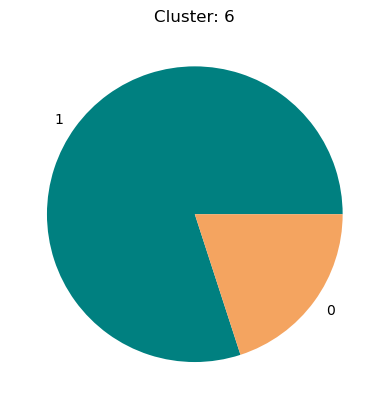

1    60
0    15
Name: bot, dtype: int64


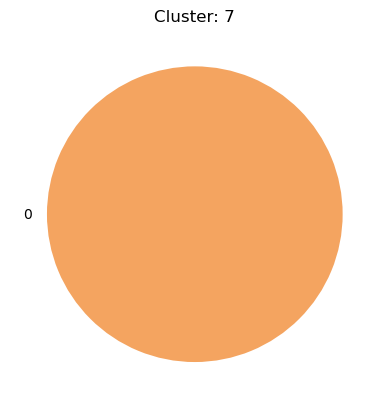

0    200
Name: bot, dtype: int64


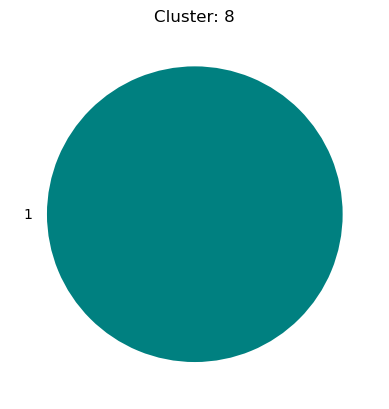

1    57
Name: bot, dtype: int64


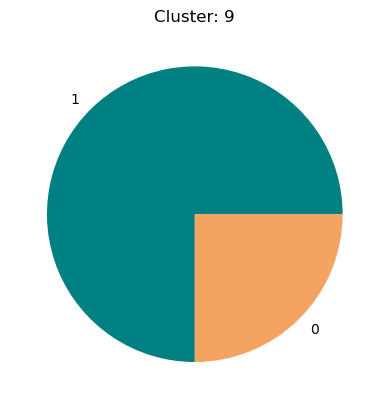

1    18
0     6
Name: bot, dtype: int64


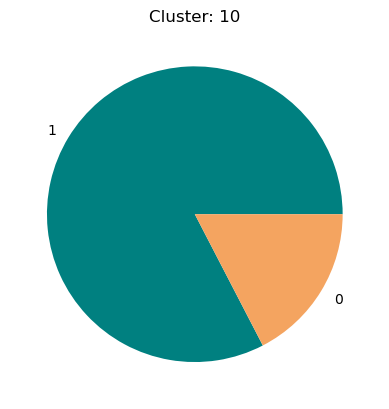

1    19
0     4
Name: bot, dtype: int64


In [115]:
for k in range(-1, n_clusters-1):
    # Get 'bot' values for elems in cluster k
    bot_for_cluster = df_bot.loc[dbscan_final_minmax.labels_ == k].value_counts()
    # Show pie plot
    plt.title('Cluster: ' + str(k))
    plt.pie(bot_for_cluster, labels= bot_for_cluster.index, colors=[dict_colors_bot[v] for v in bot_for_cluster.keys()])
    plt.show()
    print(bot_for_cluster)

#### dbscan_final_std

In [121]:
dbscan_final_std = DBSCAN(eps=0.3, min_samples=15, n_jobs=-1)
dbscan_final_std.fit(X_std)

DBSCAN(eps=0.3, min_samples=15, n_jobs=-1)

In [122]:
n_clusters = len(np.unique(dbscan_final_std.labels_))

In [123]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(dbscan_final_std.labels_,index=df.index)

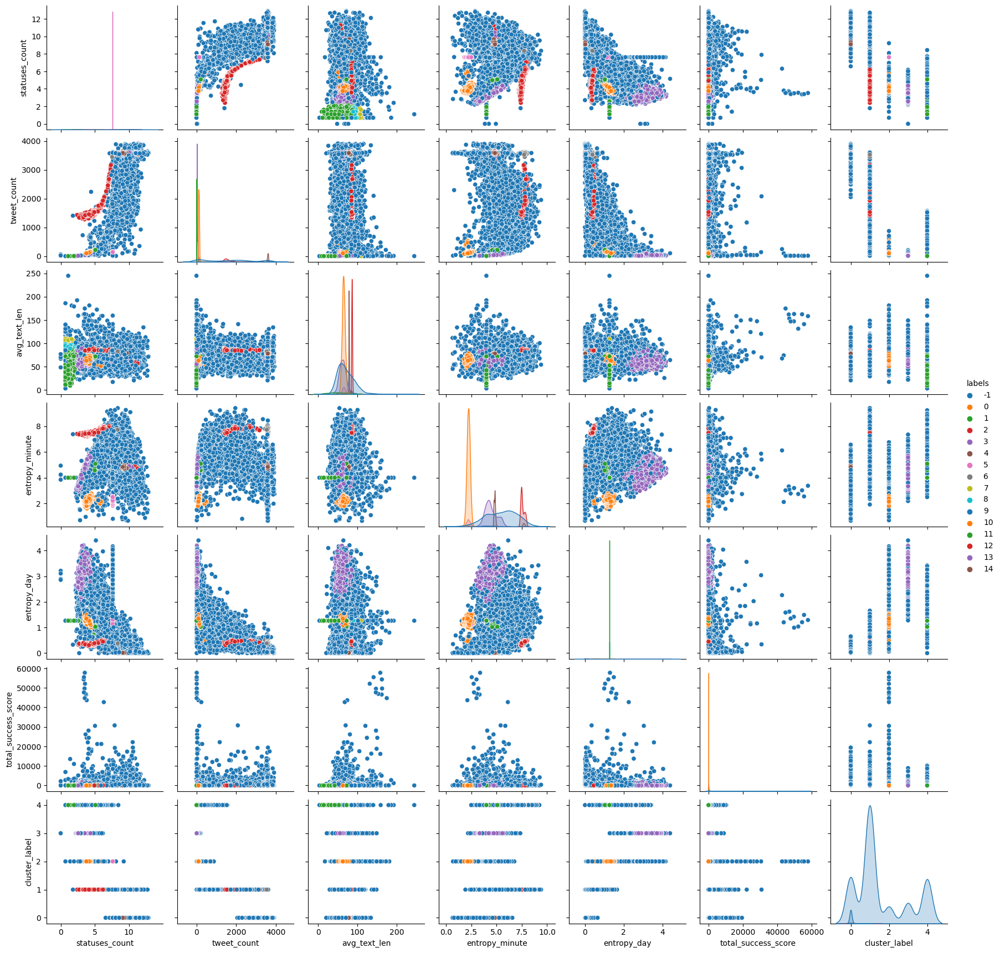

In [124]:
sns.pairplot(df,hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

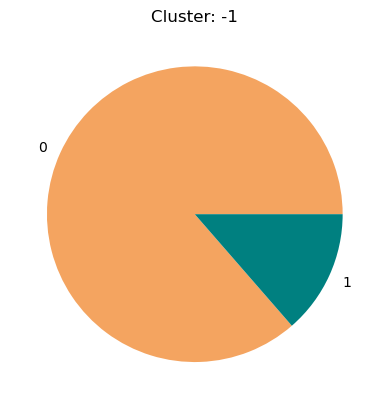

0    3608
1     568
Name: bot, dtype: int64


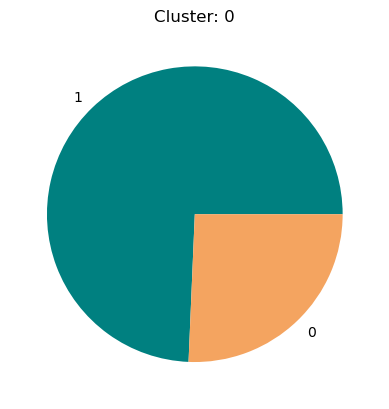

1    2342
0     809
Name: bot, dtype: int64


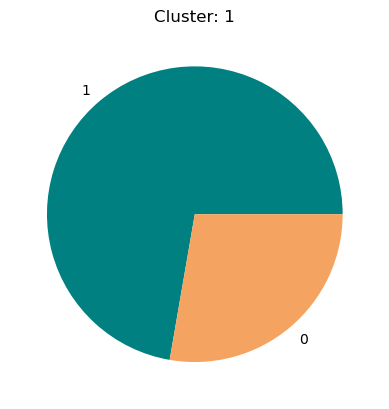

1    219
0     84
Name: bot, dtype: int64


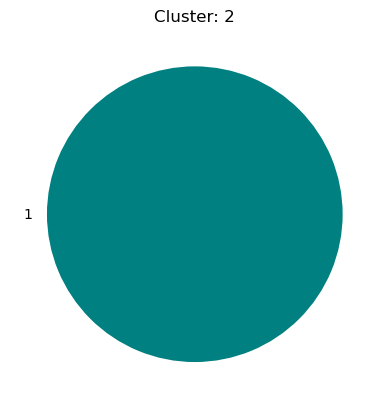

1    872
Name: bot, dtype: int64


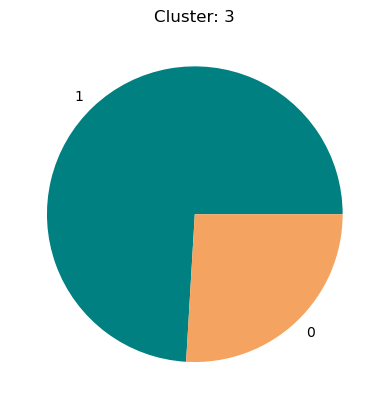

1    1579
0     553
Name: bot, dtype: int64


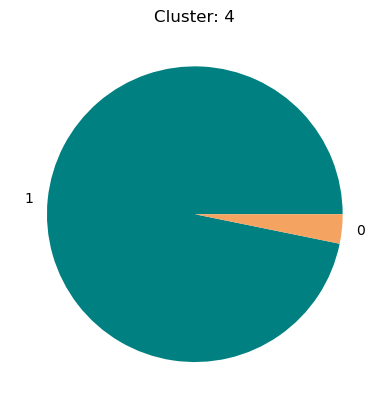

1    393
0     13
Name: bot, dtype: int64


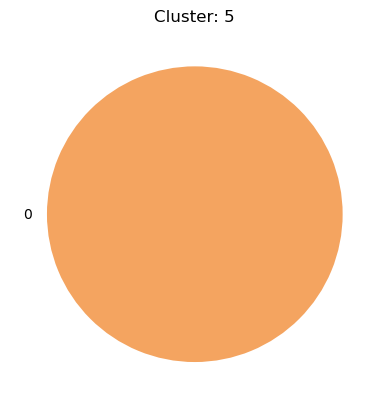

0    201
Name: bot, dtype: int64


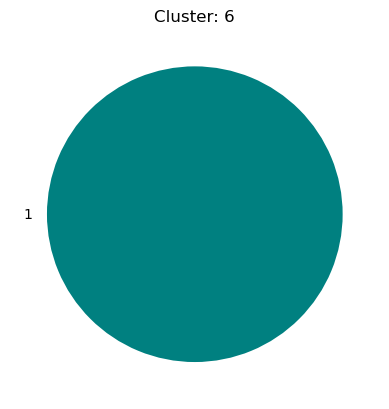

1    64
Name: bot, dtype: int64


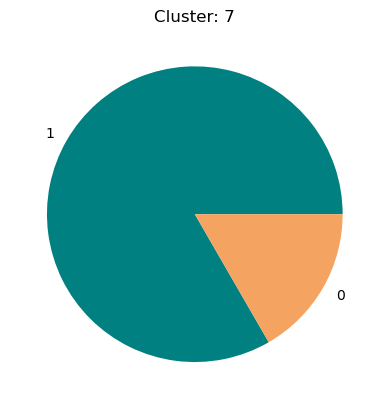

1    15
0     3
Name: bot, dtype: int64


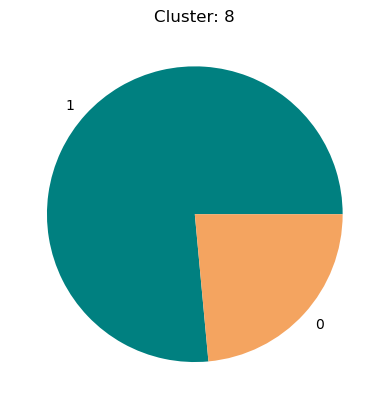

1    26
0     8
Name: bot, dtype: int64


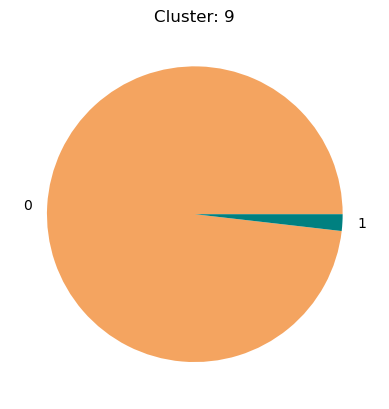

0    54
1     1
Name: bot, dtype: int64


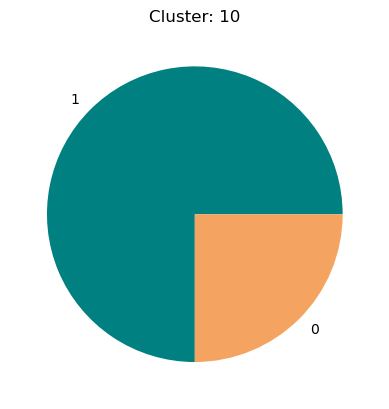

1    18
0     6
Name: bot, dtype: int64


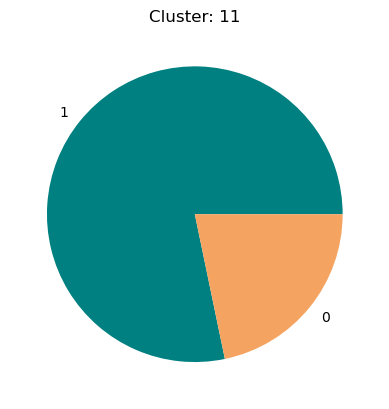

1    18
0     5
Name: bot, dtype: int64


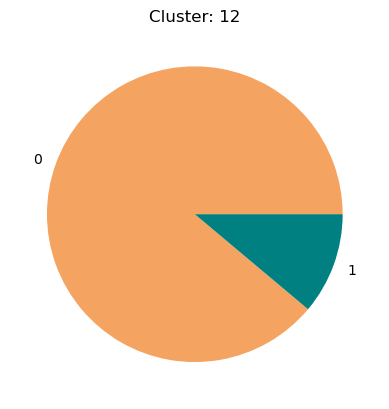

0    8
1    1
Name: bot, dtype: int64


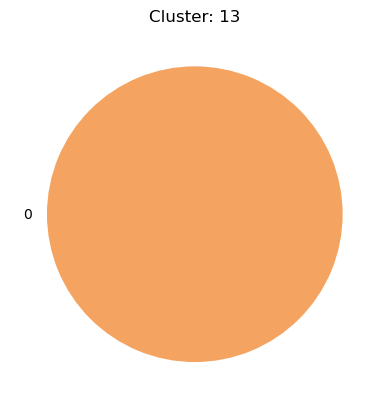

0    21
Name: bot, dtype: int64


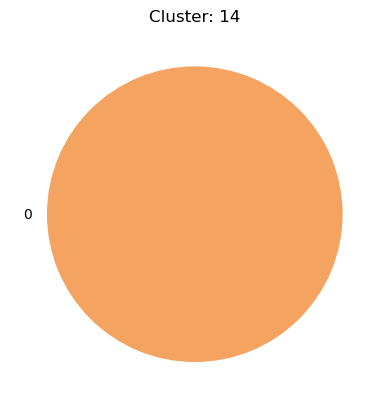

0    19
Name: bot, dtype: int64


In [125]:
for k in range(-1, n_clusters-1):
    # Get 'bot' values for elems in cluster k
    bot_for_cluster = df_bot.loc[dbscan_final_std.labels_ == k].value_counts()
    # Show pie plot
    plt.title('Cluster: ' + str(k))
    plt.pie(bot_for_cluster, labels= bot_for_cluster.index, colors=[dict_colors_bot[v] for v in bot_for_cluster.keys()])
    plt.show()
    print(bot_for_cluster)

# Hierarchical

In the following part, we explore agglomerative hierarchical clustering on our dataset.

After some preliminary trials we found that the best distance metric is **cosine**.

We also decided to discard "single" method, as it is sensitive to outliers and in our dataset we did not remove outliers based only on statistical methods.

Following we report the most significant dendograms of clusterings after having done a coarse selection of hierarchical clustering parameters after preliminary trials.

For each dendrogram, we selected the horizontal threshold that cuts the tree in the largest vertical interval that free of branches splits (still considering an appropriate number of clusters).

### With minmax normalization

In [133]:
config_hierarchical_minamx = []

Show generated dendrogram for hierarchical clustering with selected params and the best threshold for that dendrogram.

Method: **complete**, threshold: 0.57, n_clusters: **5**

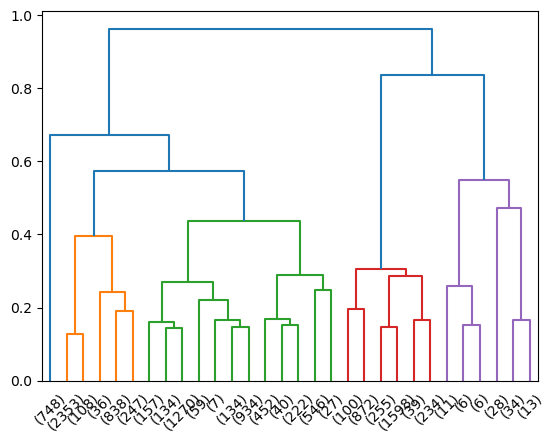

In [134]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='complete', metric='cosine')
res = dendrogram(data_link, color_threshold=0.57, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((0.57, 'cosine', 'complete'))

Method: **ward**, threshold: 5, n_clusters: **5**

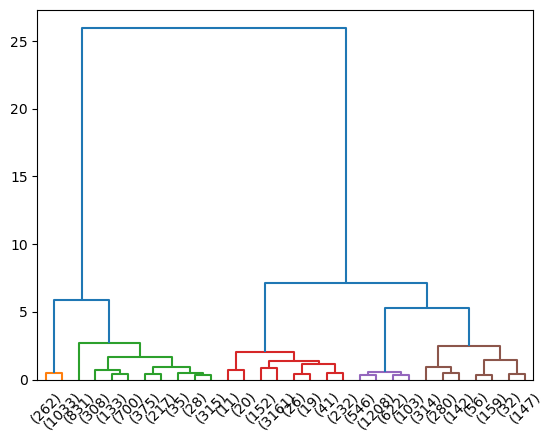

In [135]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='ward', metric='cosine')
res = dendrogram(data_link, color_threshold=5, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((5, 'cosine', 'ward'))

Method: **average**, threshold: 0.3, n_clusters: **3**

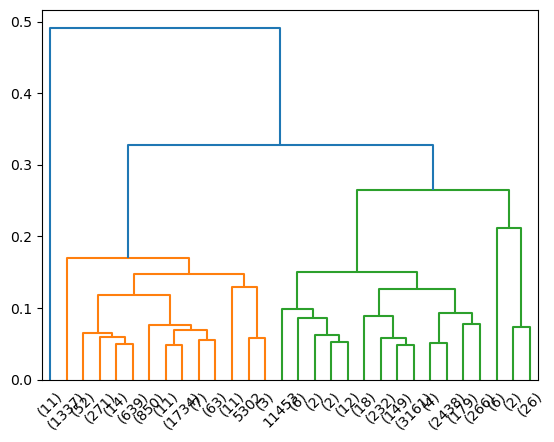

In [136]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='average', metric='cosine')
res = dendrogram(data_link, color_threshold=0.3, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((0.3, 'cosine', 'average'))

Method: **centroid**, threshold: 0.3, n_clusters: **3**

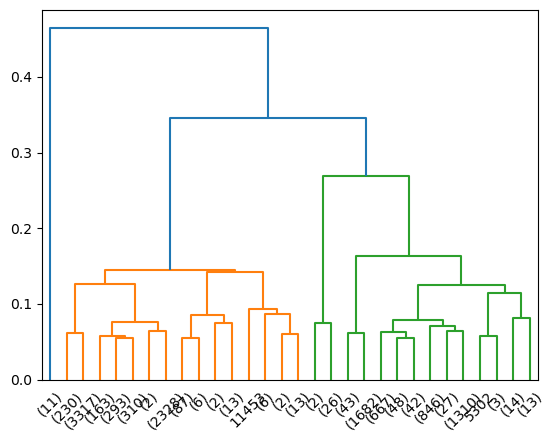

In [137]:
# Generate dendrogram
data_dist = pdist(X_minmax, metric='cosine')
data_link = linkage(data_dist, method='centroid', metric='cosine')
res = dendrogram(data_link, color_threshold=0.3, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_minamx.append((0.3, 'cosine', 'centroid'))

Fit clusterings with params found by exploring dendrograms

In [138]:
cluster_list_minmax = []
for treshold, metric_minmax, method_minmax in config_hierarchical_minamx:
    cluster = fclusterdata(X=X_minmax,
     t=treshold , criterion='distance', metric=metric_minmax, method=method_minmax)
     
    cluster_list_minmax.append(cluster)

Calculate Silhouette for each clustering.

In [139]:
for i, clustering in enumerate(cluster_list_minmax):
    treshold, metric, method = config_hierarchical_minamx[i]
    n_clusters = len(np.unique(clustering))
    occ_list = []
    for k in range(1, n_clusters+1):
        occ_list.append(np.count_nonzero(clustering == k))

    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_minmax, clustering)
    except:
        silhouette = np.nan
    print("MINMAX - dist:", metric, ", method:", method, ", SILHOUTTE:", silhouette, ", n_clusters:", n_clusters)
    print('Clusters Size:', occ_list)
    print('\n')

MINMAX - dist: cosine , method: complete , SILHOUTTE: 0.4262274515238207 , n_clusters: 5
Clusters Size: [748, 3582, 3982, 3098, 98]


MINMAX - dist: cosine , method: ward , SILHOUTTE: 0.49984154130504066 , n_clusters: 5
Clusters Size: [1295, 2942, 3662, 2479, 1130]


MINMAX - dist: cosine , method: average , SILHOUTTE: 0.5095511058334584 , n_clusters: 3
Clusters Size: [11, 4993, 6504]


MINMAX - dist: cosine , method: centroid , SILHOUTTE: 0.5273514540223294 , n_clusters: 3
Clusters Size: [11, 6773, 4724]




### With mean-std normalization

In [146]:
config_hierarchical_std = []

Show generated dendrogram for hierarchical clustering with selected params and the best threshold for that dendrogram.

Method: **complete**, threshold: 1.0, n_clusters: **24**

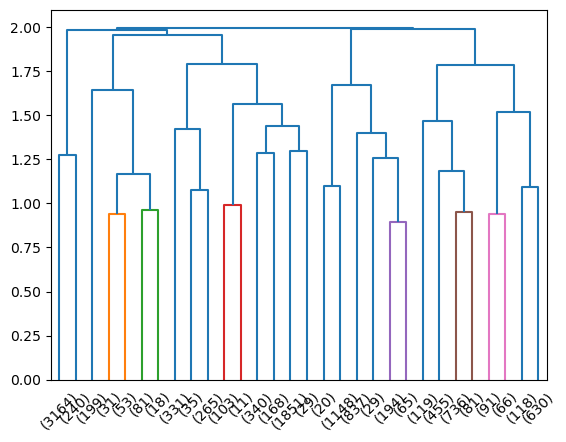

In [147]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='complete', metric='cosine')
res = dendrogram(data_link, color_threshold=1.05, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((1.05, 'cosine', 'complete'))

Method: **ward**, threshold: 25, n_clusters: **4**

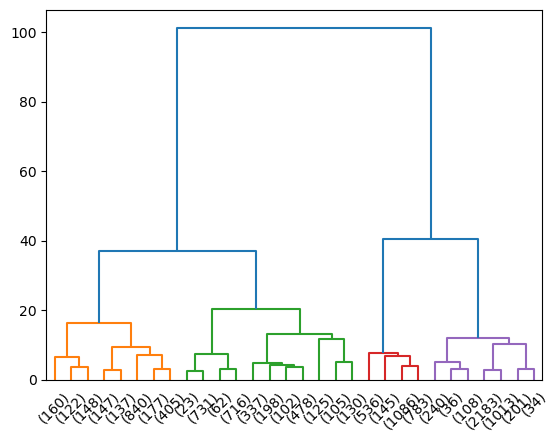

In [148]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='ward', metric='cosine')
res = dendrogram(data_link, color_threshold=25, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((25, 'cosine', 'ward'))

Method: **average**, threshold: 1.2, n_clusters: **2**

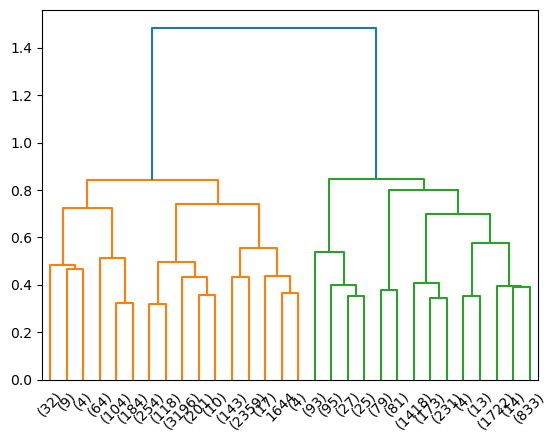

In [149]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='average', metric='cosine')
res = dendrogram(data_link, color_threshold=1.2, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((1.2, 'cosine', 'average'))

Method: **centroid**, threshold: 0.8, n_clusters: **3**

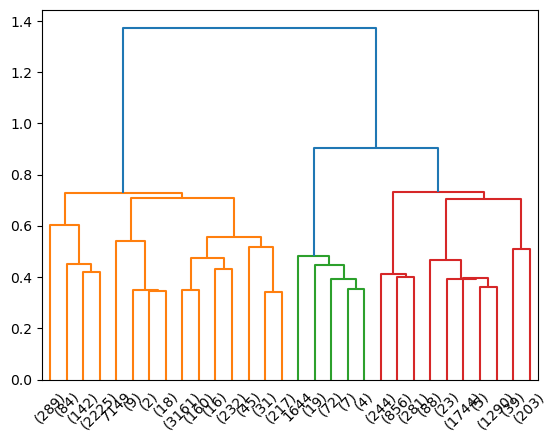

In [150]:
# Generate dendrogram
data_dist = pdist(X_std, metric='cosine')
data_link = linkage(data_dist, method='centroid', metric='cosine')
res = dendrogram(data_link, color_threshold=0.8, truncate_mode='lastp')
plt.show()
# Append params for this dendrogram to list
config_hierarchical_std.append((0.8, 'cosine', 'centroid'))

Fit clusterings with params found by exploring dendrograms

In [151]:
cluster_list_std = []
for treshold, metric_std, method_std in config_hierarchical_std:
    cluster = fclusterdata(X=X_std,
     t=treshold , criterion='distance', metric=metric_std, method=method_std)
     
    cluster_list_std.append(cluster)

Calculate Silhouette for each clustering.

In [153]:
for i, clustering in enumerate(cluster_list_std):
    treshold, metric, method = config_hierarchical_std[i]
    n_clusters = len(np.unique(clustering))
    occ_list = []
    for k in range(1, n_clusters+1):
        occ_list.append(np.count_nonzero(clustering == k))

    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_std, clustering)
    except:
        silhouette = np.nan
    print("STD - dist:", metric, ", method:", method, ", SILHOUTTE:", silhouette, ", n_clusters:", n_clusters)
    print('Clusters Size:', occ_list)
    print('\n')

STD - dist: cosine , method: complete , SILHOUTTE: 0.3651310635871268 , n_clusters: 24
Clusters Size: [3164, 240, 199, 84, 99, 331, 35, 265, 114, 340, 168, 1851, 29, 20, 1148, 837, 29, 259, 119, 455, 817, 157, 118, 630]


STD - dist: cosine , method: ward , SILHOUTTE: 0.43041736034678985 , n_clusters: 4
Clusters Size: [2136, 3007, 2550, 3815]


STD - dist: cosine , method: average , SILHOUTTE: 0.44874307070995373 , n_clusters: 2
Clusters Size: [6700, 4808]


STD - dist: cosine , method: centroid , SILHOUTTE: 0.4547538936645913 , n_clusters: 3
Clusters Size: [6632, 103, 4773]




We selected 2 clustering among all of the analyzed, based on the goodness of the dendrogram, the number of clusters and the distribution of samples in the clusters. Slihouette was not much significant as it has similar scores across all hierarchical models.

We noticed that the algorithm that generated the best dendrograms was using the "ward" method.
Clusterings gernerated with "ward", in fact, present well distanced clusters and no small cluster with very few values.

Selcted for further analysis:
1.  MINMAX normalization - Method: **ward**, threshold: 5, n_clusters: **5**, Silhouette: 0.49
2.  STD normalization - Method: **ward**, threshold: 25, n_clusters: **4**, silhouette: 0.43

In [155]:
hierarchical_final_ward_minmax = cluster_list_minmax[1] # Hierarchical clustering with 5 clusters
hierarchical_final_ward_std = cluster_list_std[1] # Hierarchical clustering with 4 clusters

# ATTENTION: CLUSTER LABELS GO FROM 1 TO N_CLUSTERS INSTEAD OF FROM 0 TO N_CLUSTERS-1

### Further analysis of final hierarchical

#### hierarchical_final_ward_minmax

In [156]:
n_clusters = len(np.unique(hierarchical_final_ward_minmax))

Scatter plots

In [157]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(hierarchical_final_ward_minmax,index=df.index)

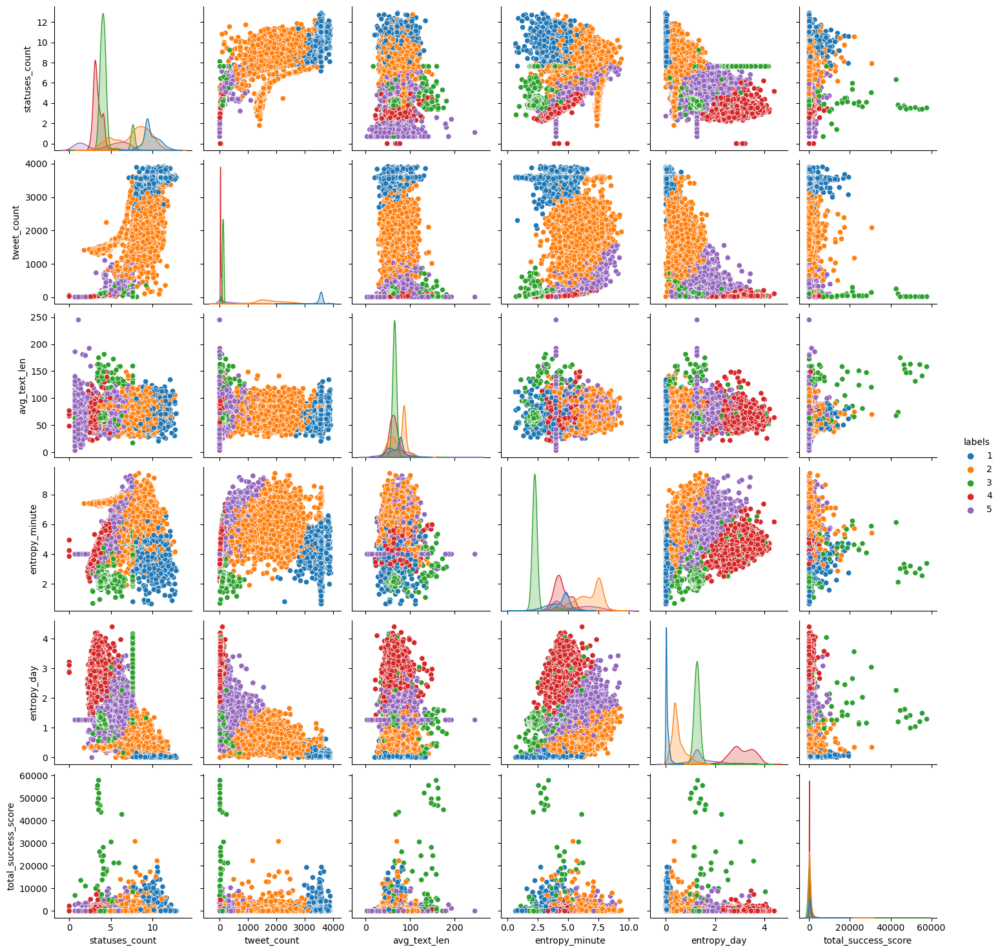

In [162]:
sns.pairplot(df, hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

Bot/non bot distribution for each cluster

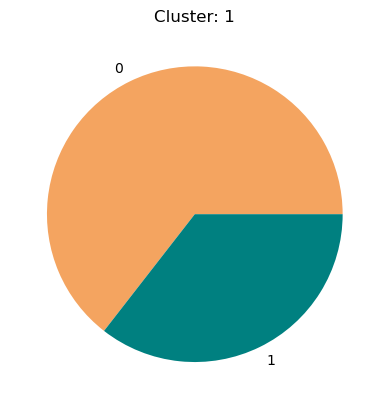

0    835
1    460
Name: bot, dtype: int64


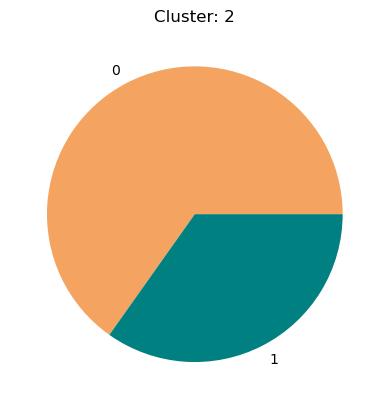

0    1918
1    1024
Name: bot, dtype: int64


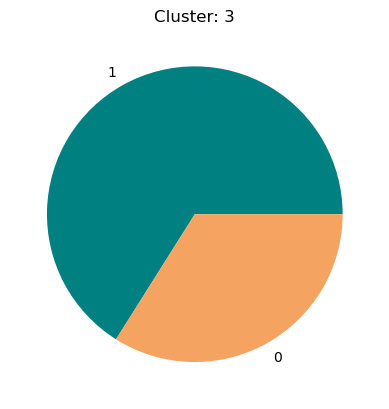

1    2419
0    1243
Name: bot, dtype: int64


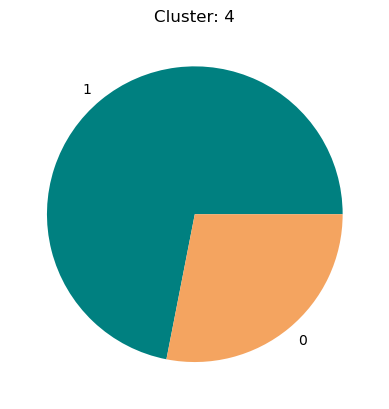

1    1783
0     696
Name: bot, dtype: int64


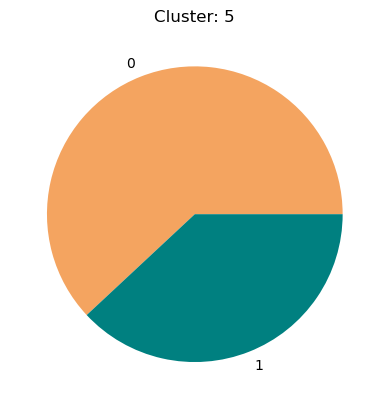

0    700
1    430
Name: bot, dtype: int64


In [163]:
for k in range(1, n_clusters+1):
    # Get 'bot' values for elems in cluster k
    bot_for_cluster = df_bot.loc[hierarchical_final_ward_minmax == k].value_counts()
    # Show pie plot
    plt.title('Cluster: ' + str(k))
    plt.pie(bot_for_cluster, labels= bot_for_cluster.index, colors=[dict_colors_bot[v] for v in bot_for_cluster.keys()])
    plt.show()
    print(bot_for_cluster)

#### hierarchical_final_ward_std

In [164]:
n_clusters = len(np.unique(hierarchical_final_ward_std))

Scatter plots

In [165]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(hierarchical_final_ward_std,index=df.index)

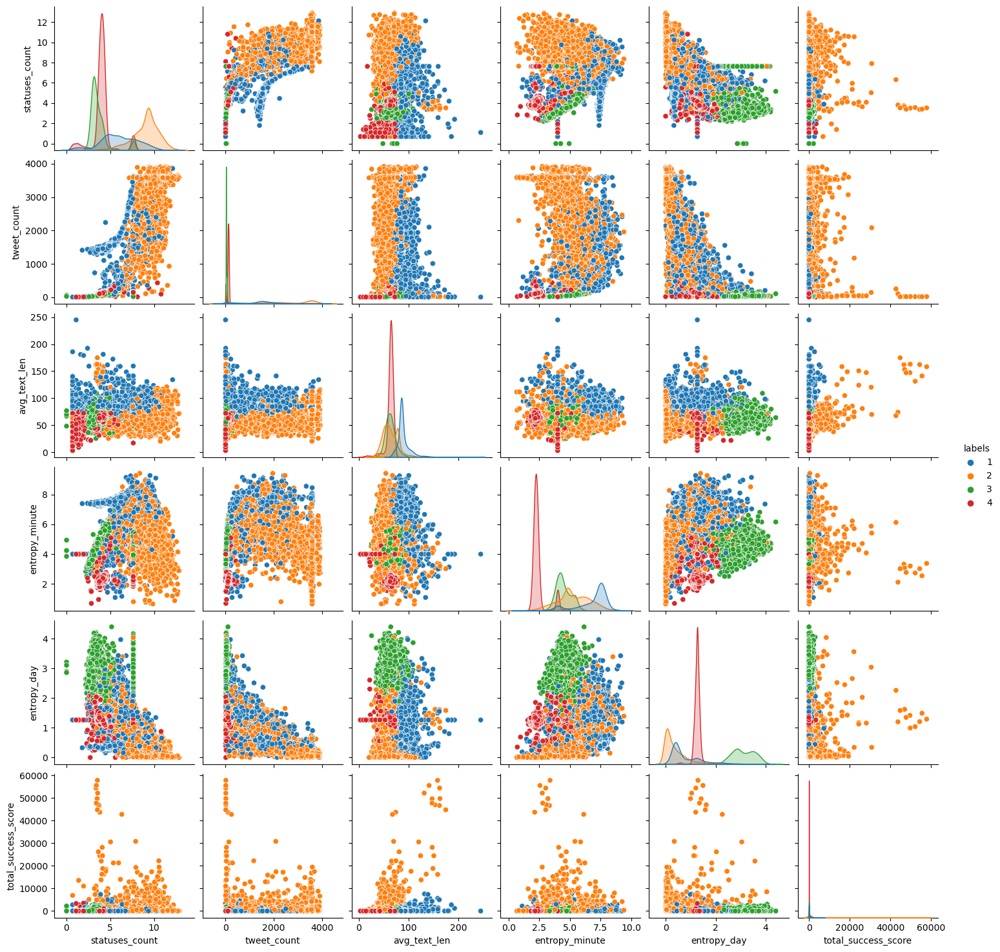

In [166]:
sns.pairplot(df,hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

Bot/non bot distribution for each cluster

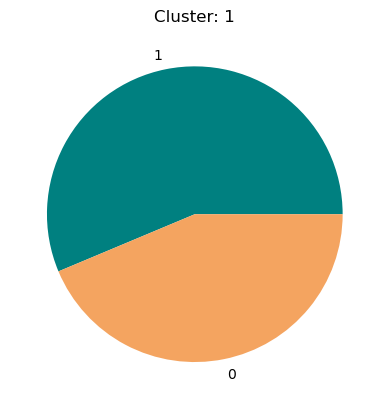

1    1203
0     933
Name: bot, dtype: int64


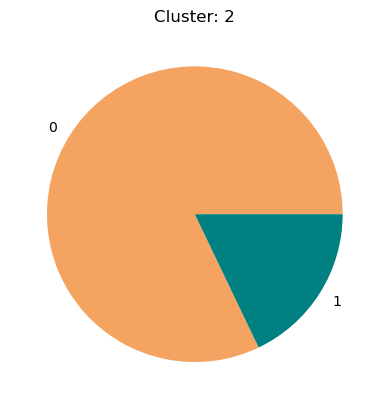

0    2469
1     538
Name: bot, dtype: int64


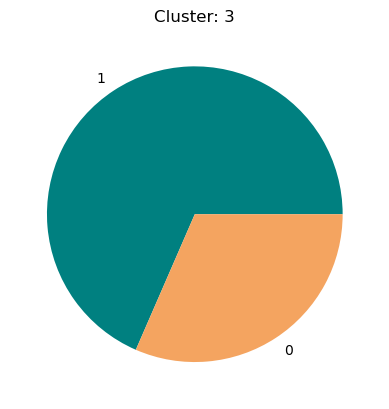

1    1746
0     804
Name: bot, dtype: int64


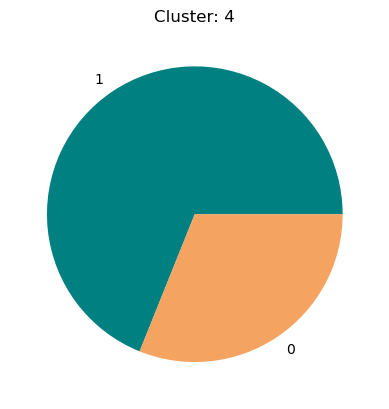

1    2629
0    1186
Name: bot, dtype: int64


In [167]:
for k in range(1, n_clusters+1):
    # Get 'bot' values for elems in cluster k
    bot_for_cluster = df_bot.loc[hierarchical_final_ward_std == k].value_counts()
    # Show pie plot
    plt.title('Cluster: ' + str(k))
    plt.pie(bot_for_cluster, labels= bot_for_cluster.index, colors=[dict_colors_bot[v] for v in bot_for_cluster.keys()])
    plt.show()
    print(bot_for_cluster)

## K-MEANS

For K-Means we chose to use **minmax normalization**, as it is known to be a more suited normalization for this algorithm.

This function returns a set of trained K-Means from a list of possible k values

In [168]:
def KMeansFunction (X, n_clusters_list, n_init_value, max_iter_value=300):
    kmeans_list = list()

    for numCluster in tqdm(n_clusters_list):
        # Define and fit K-Means
        kmeans = KMeans(n_clusters=numCluster, n_init=n_init_value, max_iter=max_iter_value)
        kmeans.fit(X)
        kmeans_list.append(kmeans)
    
    return kmeans_list

Now we generate the K-Means clusterings and evaluate them.

In [171]:
# Params for kmeans
clusters_list = [x for x in range(2, 17)]
init_value = 10
iter_value = 300

# Get list of kmeans with from the list of possible k
kmeans_list = KMeansFunction (X_minmax, clusters_list, init_value, iter_value)

# Calculate SSE and Silhouette for each kmeans
sse_list = []
silhouette_list = []
for i, kmeans in enumerate(kmeans_list):
    sse_list.append(kmeans.inertia_)
    try: # Exception in case of num_clusters=1
        silhouette = silhouette_score(X_minmax, kmeans.labels_)
    except:
        silhouette = np.nan # silhouette returns exception when there is only 1 label
    silhouette_list.append(silhouette)

    print('K:', clusters_list[i], ' - SSE:', kmeans.inertia_, '- SILHOUETTE:', silhouette)


100%|██████████| 15/15 [00:04<00:00,  3.73it/s]


K: 2  - SSE: 1180.9546041968808 - SILHOUETTE: 0.5503723955734771
K: 3  - SSE: 803.1209085391026 - SILHOUETTE: 0.5384783187726828
K: 4  - SSE: 479.05159619504974 - SILHOUETTE: 0.5510388262012912
K: 5  - SSE: 398.8985168006501 - SILHOUETTE: 0.5326106691231733
K: 6  - SSE: 348.4124445601632 - SILHOUETTE: 0.5506936158367843
K: 7  - SSE: 312.8714160299895 - SILHOUETTE: 0.5415314377723943
K: 8  - SSE: 288.39127600622146 - SILHOUETTE: 0.5343208043858289
K: 9  - SSE: 261.958853105975 - SILHOUETTE: 0.5005467085783829
K: 10  - SSE: 243.30623034999604 - SILHOUETTE: 0.5027707047104639
K: 11  - SSE: 226.41035806201143 - SILHOUETTE: 0.5082302875365138
K: 12  - SSE: 210.80898541921385 - SILHOUETTE: 0.5115446566006847
K: 13  - SSE: 199.038263515212 - SILHOUETTE: 0.49100912979378697
K: 14  - SSE: 187.75587337804063 - SILHOUETTE: 0.49481197735133986
K: 15  - SSE: 176.99808185594924 - SILHOUETTE: 0.5003713167626894
K: 16  - SSE: 167.57920023898959 - SILHOUETTE: 0.5049948646496959


Plot SSE graph

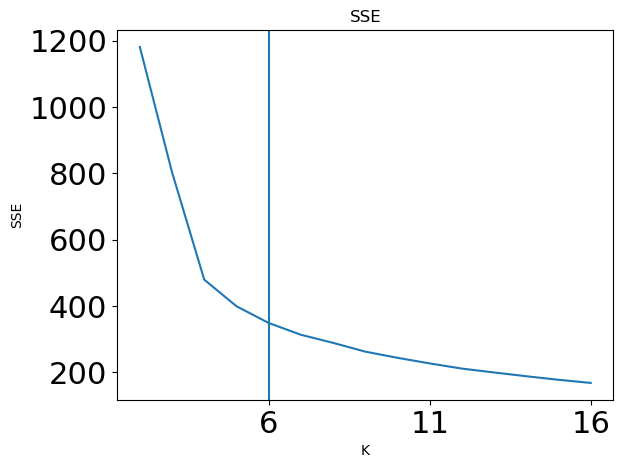

In [175]:
plt.plot(range(2, len(sse_list) + 2), sse_list)
plt.ylabel('SSE')
plt.xlabel('K')
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xticks(clusters_list[4::5])
plt.title('SSE')
plt.axvline(6)
plt.show()

Plot Silhouette graph

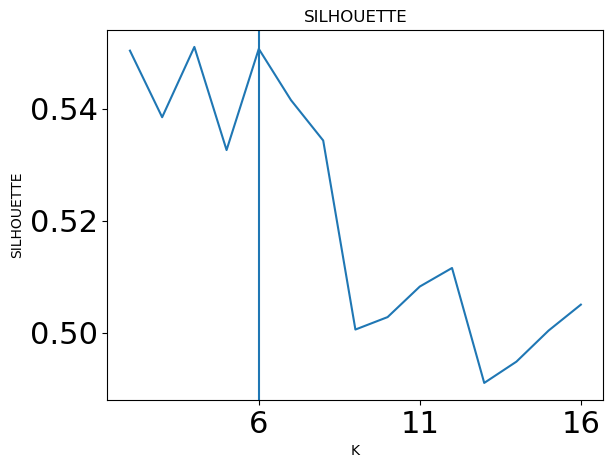

In [176]:
plt.plot(range(2, len(silhouette_list) + 2), silhouette_list)
plt.ylabel('SILHOUETTE')
plt.xlabel('K')
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xticks(clusters_list[4::5])
plt.title('SILHOUETTE')
plt.axvline(6)
plt.show()

For K-Means, after analyizing SSE and Silhouette, we selected K=6, as it is approximately at the last significant SSE decrease in the SSE graph, while mantaining a relatively high Silhouette (higher than the sudden drop of Silhouette at K=7 or K=8).

We also considered the number of clusters identified with hierarchical algorithms as an indication of the range of K to consider.

In [181]:
final_kmeans = kmeans_list[4]

### Further analysis of final K-Means

Plot of cluster labels distribution

In [182]:
# Calculate number of clusters for final kmeans
n_clusters = len(np.unique(final_kmeans.labels_))

# Calculate list of label occurrencies for each cluster
occ_list = []
for k in range(n_clusters):
    occ_list.append(np.count_nonzero(final_kmeans.labels_ == k))

print('cluster occurrencies:', occ_list)

cluster occurrencies: [2627, 871, 1499, 3987, 922, 1602]


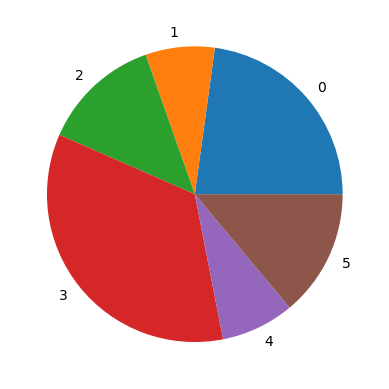

In [183]:
label= range(n_clusters)
plt.pie(occ_list, labels=label, colors=sns.color_palette(n_colors=n_clusters))
plt.show()

Show scatter plot

In [184]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = pd.Series(final_kmeans.labels_,index=df.index)

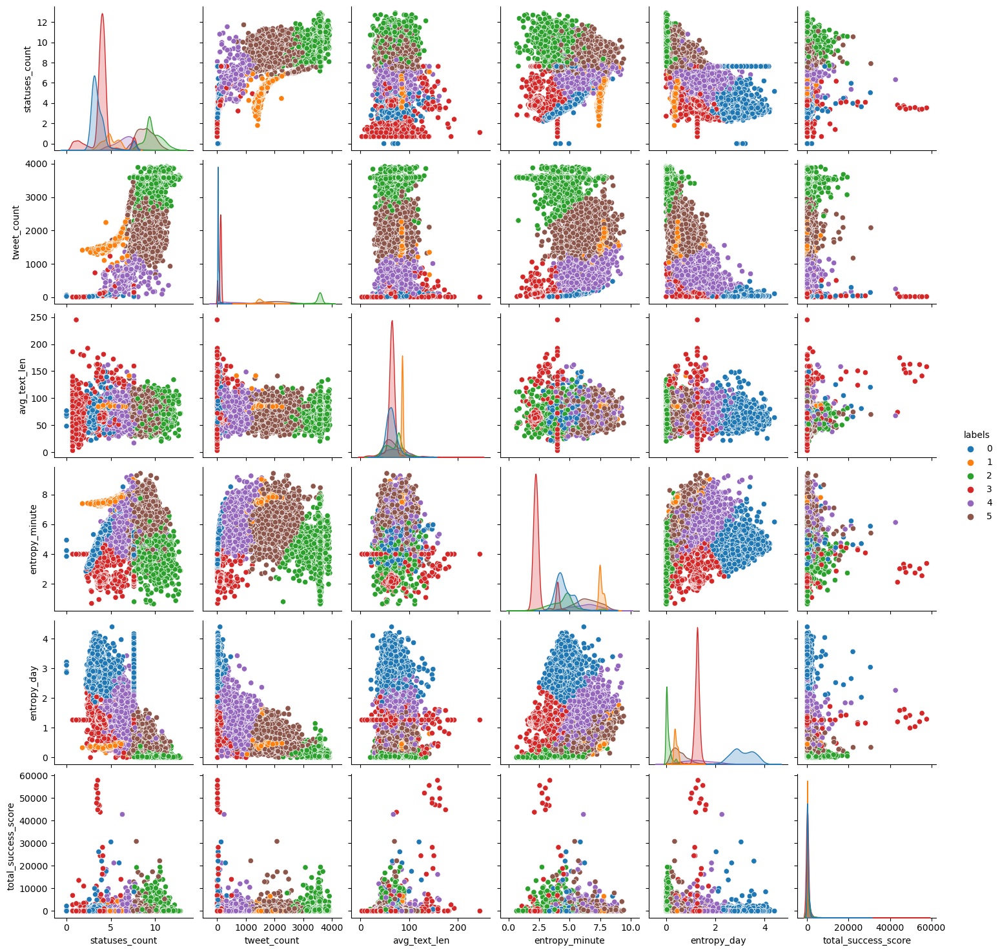

In [185]:
sns.pairplot(df,hue='labels', palette=sns.color_palette(n_colors=n_clusters))
plt.show()

Bot/non bot distribution for each cluster

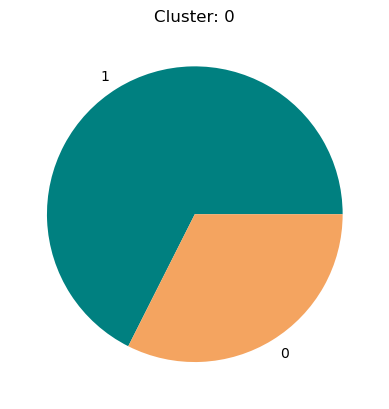

1    1775
0     852
Name: bot, dtype: int64


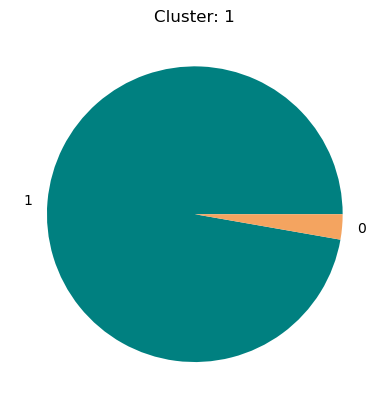

1    847
0     24
Name: bot, dtype: int64


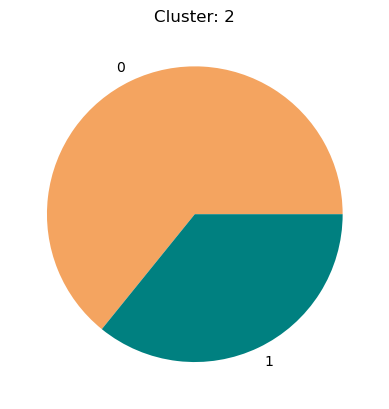

0    962
1    537
Name: bot, dtype: int64


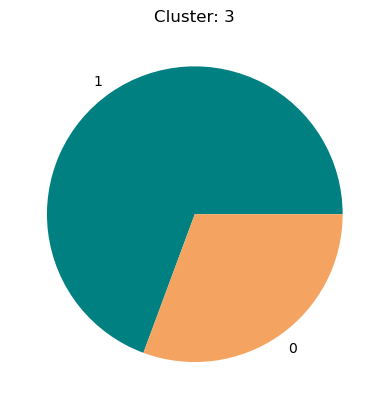

1    2765
0    1222
Name: bot, dtype: int64


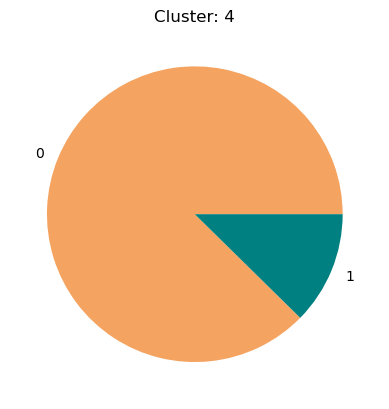

0    808
1    114
Name: bot, dtype: int64


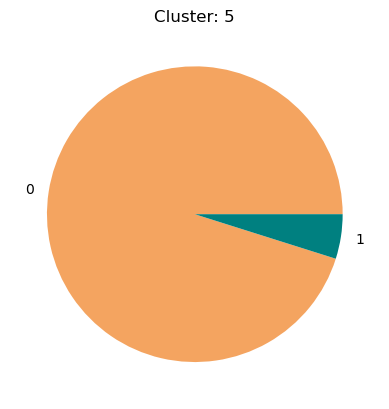

0    1524
1      78
Name: bot, dtype: int64


In [186]:
# Calculate number of clusters for final kmeans
n_clusters = len(np.unique(final_kmeans.labels_))

for k in range(n_clusters):
    # Get 'bot' values for elems in cluster k
    bot_for_cluster = df_bot.loc[final_kmeans.labels_ == k].value_counts()
    # Show pie plot
    labels = ['non-bot', 'bot']
    plt.title('Cluster: ' + str(k))
    plt.pie(bot_for_cluster, labels= bot_for_cluster.index, colors=[dict_colors_bot[v] for v in bot_for_cluster.keys()])
    plt.show()
    print(bot_for_cluster)

# Final selected minimal clustering

The final selected clustering method is the **K Means**.

This choice was made by looking at the distribution of the clusters, their consistency in the scatter plot and to the distribution of bots and non-bots in each cluster.

Generate dataframe with average values for each attribute for each cluster

In [200]:
if 'labels' in df.columns:
    del df['labels']
df['labels'] = final_kmeans.labels_ -1 # -1 for putting labels in range (0, 5)



In [210]:
df_normalized = df.copy()

df_normalized.statuses_count = np.log2(df_normalized.statuses_count + 1)
df_normalized.tweet_count = np.log2(df_normalized.tweet_count + 1)
df_normalized.total_success_score = np.log2(df_normalized.total_success_score + 1)
df_normalized.avg_text_len = np.log2(df_normalized.avg_text_len + 1)
df_normalized.entropy_day = np.log2(df_normalized.entropy_day + 1)
df_normalized.entropy_minute = np.log2(df_normalized.entropy_minute + 1)

In [211]:
df_group_cluster = df_normalized.groupby(by='labels').mean()
df_group_cluster.columns

Index(['statuses_count', 'tweet_count', 'avg_text_len', 'entropy_minute',
       'entropy_day', 'total_success_score'],
      dtype='object')

Function to generate radar plot

In [212]:
def make_spider(row, title, color, partial_df):
    # number of attributes N
    categories=list(partial_df)
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of attrs)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(2,3,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    #plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
    #plt.ylim(0,40)

    # Ind1
    values=partial_df.loc[row].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=11, color=color, y=1.1)

Sets of attributes for each radarplot

In [213]:
col_set = ['statuses_count', 'tweet_count', 'avg_text_len', 'entropy_minute',
       'entropy_day', 'total_success_score']

Generate radarplots

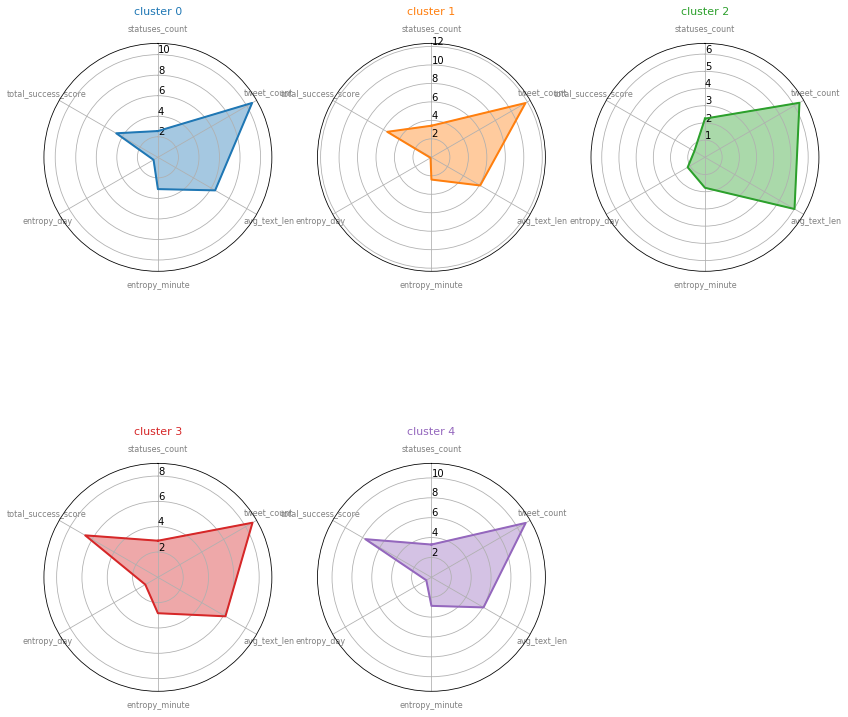

In [214]:
# Create a color palette
my_palette = sns.color_palette(n_colors=5)
 
# Loop to plot

my_dpi = 72
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)

# Create 5 radar plots for each sets of attributes
for row in range(0, len(df_group_cluster[col_set].index)-1):
    make_spider(row=row, title='cluster ' + str(row),
    color=my_palette[row],
    partial_df=df_group_cluster[col_set])
plt.show()

## Considerations about clusters

Remember that the clusters are:
* 0: predominantly bot
* 1: predominantly bot
* 2: predominantly nonbot
* 3: all bot
* 4: all nonbot

We found that clusters including mostly bots have a lot of tweets from 2019, 2018 and 2017, while clusters with mostly humans have tweets mostly in 2020.

Cluster 1 of mostly bots also has much less tweets for user. Clusters 3 and 4 instead have many more tweets per user on average (over 2000). Among all, average tweet text length does not change much.

Clusters 3 and 4 of exlusively bots and exlusively humans have higher favorite sum, but cluster 4 of humans have the highest retweet sum on average, indicating that humans (at least in this cluster) gets more retweets.

Clusters 0 and 1 instead present users with few likes and retweets on average.